<a href="https://colab.research.google.com/github/rohan472000/delhi-weather-analysis-prediction-Prophet/blob/main/weather_delhi_proph.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import prophet

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [43]:
dirname = 'drive/My Drive/archive_3/delhi.csv'
fd = pd.read_csv(dirname,index_col="date_time")  # to make datetime column as index column
fd1 = pd.read_csv(dirname)

In [4]:
fd.head()

,maxtempC,mintempC,totalSnow_cm,sunHour,uvIndex,uvIndex.1,moon_illumination,moonrise,moonset,sunrise,...,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
date_time,,,,,,,,,,,,,,,,,,,,,
2009-01-01 00:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,07:14 AM,...,14,19,0,50,0.0,1016,10,10,331,12
2009-01-01 01:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,07:14 AM,...,13,21,0,51,0.0,1016,10,10,329,13
2009-01-01 02:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,07:14 AM,...,12,22,0,52,0.0,1016,9,10,327,13
2009-01-01 03:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,07:14 AM,...,11,23,0,54,0.0,1016,9,10,326,13
2009-01-01 04:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,07:14 AM,...,11,21,2,52,0.0,1016,9,10,318,13


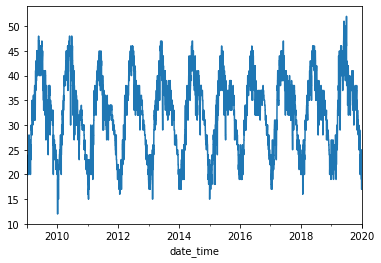

In [40]:
fd['maxtempC'].plot()

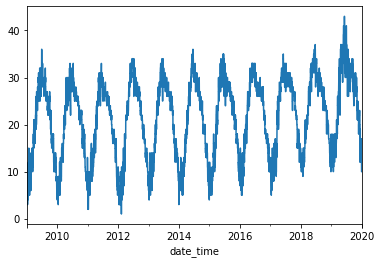

In [41]:
fd['mintempC'].plot()

In [5]:
fd.apply(pd.isnull).sum()

maxtempC             0
mintempC             0
totalSnow_cm         0
sunHour              0
uvIndex              0
uvIndex.1            0
moon_illumination    0
moonrise             0
moonset              0
sunrise              0
sunset               0
DewPointC            0
FeelsLikeC           0
HeatIndexC           0
WindChillC           0
WindGustKmph         0
cloudcover           0
humidity             0
precipMM             0
pressure             0
tempC                0
visibility           0
winddirDegree        0
windspeedKmph        0
dtype: int64

In [6]:
fd.index = pd.to_datetime(fd.index)

In [7]:
fd.index

DatetimeIndex(['2009-01-01 00:00:00', '2009-01-01 01:00:00',
               '2009-01-01 02:00:00', '2009-01-01 03:00:00',
               '2009-01-01 04:00:00', '2009-01-01 05:00:00',
               '2009-01-01 06:00:00', '2009-01-01 07:00:00',
               '2009-01-01 08:00:00', '2009-01-01 09:00:00',
               ...
               '2020-01-01 14:00:00', '2020-01-01 15:00:00',
               '2020-01-01 16:00:00', '2020-01-01 17:00:00',
               '2020-01-01 18:00:00', '2020-01-01 19:00:00',
               '2020-01-01 20:00:00', '2020-01-01 21:00:00',
               '2020-01-01 22:00:00', '2020-01-01 23:00:00'],
              dtype='datetime64[ns]', name='date_time', length=96432, freq=None)

In [8]:
fd.index.year

Int64Index([2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009, 2009,
            ...
            2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020, 2020],
           dtype='int64', name='date_time', length=96432)

In [9]:
fd.index.month

Int64Index([1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
            ...
            1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
           dtype='int64', name='date_time', length=96432)

In [10]:
new_fd = fd[['maxtempC','mintempC','uvIndex','FeelsLikeC','HeatIndexC']]

In [11]:
new_fd.columns

Index(['maxtempC', 'mintempC', 'uvIndex', 'FeelsLikeC', 'HeatIndexC'], dtype='object')

In [12]:
new_fd.head()

,maxtempC,mintempC,uvIndex,FeelsLikeC,HeatIndexC
date_time,,,,,
2009-01-01 00:00:00,22,9,4,14,14
2009-01-01 01:00:00,22,9,4,13,14
2009-01-01 02:00:00,22,9,4,12,13
2009-01-01 03:00:00,22,9,4,11,13
2009-01-01 04:00:00,22,9,4,11,13


In [13]:
new_fd['y'] = new_fd.shift(-1)['maxtempC']

<ipython-input-13-8daab477ad1f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather['y'] = weather.shift(-1)['maxtempC']


In [14]:
new_fd = new_fd.ffill()

In [15]:
new_fd.isnull().sum()

maxtempC      0
mintempC      0
uvIndex       0
FeelsLikeC    0
HeatIndexC    0
y             0
dtype: int64

In [16]:
new_fd["ds"] = new_fd.index

In [17]:
predictors = new_fd.columns[~new_fd.columns.isin(['y','ds'])]

In [18]:
fd.index.year.value_counts().sort_index()

2009    8760
2010    8760
2011    8760
2012    8784
2013    8760
2014    8760
2015    8760
2016    8784
2017    8760
2018    8760
2019    8760
2020      24
Name: date_time, dtype: int64

In [19]:
train = new_fd[:'2019-02-02']
test = new_fd['2019-02-02':]

In [20]:
new_fd.columns

Index(['maxtempC', 'mintempC', 'uvIndex', 'FeelsLikeC', 'HeatIndexC', 'y',
       'ds'],
      dtype='object')

In [21]:
from prophet import Prophet

def fitt_proph(train):
  a = Prophet()
  for b in predictors:
    a.add_regressor(b)
  a.fit(train)
  return a  

c  = fitt_proph(train) 

DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/w8v0quko.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/8gp3ih9z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98531', 'data', 'file=/tmp/tmpupb5hz6b/w8v0quko.json', 'init=/tmp/tmpupb5hz6b/8gp3ih9z.json', 'output', 'file=/tmp/tmpupb5hz6b/prophet_modelb3i35x38/prophet_model-20230105102920.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:29:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:30:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [22]:
predictions = c.predict(test)

In [23]:
predictions.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,FeelsLikeC,FeelsLikeC_lower,FeelsLikeC_upper,HeatIndexC,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-02-02 00:00:00,32.441574,23.527429,24.476109,32.441574,32.441574,-0.044769,-0.044769,-0.044769,-0.019627,...,0.000409,0.000409,0.000409,-0.108829,-0.108829,-0.108829,0.0,0.0,0.0,24.015346
1,2019-02-02 01:00:00,32.441574,23.515650,24.466982,32.441574,32.441574,-0.049135,-0.049135,-0.049135,-0.021518,...,0.000565,0.000565,0.000565,-0.108750,-0.108750,-0.108750,0.0,0.0,0.0,24.011515
2,2019-02-02 02:00:00,32.441573,23.556388,24.503492,32.441573,32.441573,-0.049135,-0.049135,-0.049135,-0.021518,...,0.000721,0.000721,0.000721,-0.108670,-0.108670,-0.108670,0.0,0.0,0.0,24.014154
3,2019-02-02 03:00:00,32.441572,23.542778,24.465109,32.441572,32.441572,-0.053501,-0.053501,-0.053501,-0.023409,...,0.000875,0.000875,0.000875,-0.108590,-0.108590,-0.108590,0.0,0.0,0.0,24.008633
4,2019-02-02 04:00:00,32.441572,23.535258,24.473897,32.441572,32.441572,-0.057867,-0.057867,-0.057867,-0.023409,...,0.001028,0.001028,0.001028,-0.108511,-0.108511,-0.108511,0.0,0.0,0.0,24.001272


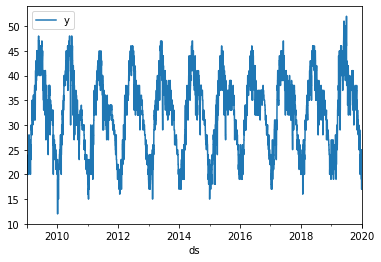

In [24]:
new_fd.plot('ds','y')

In [25]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(c, predictions)

In [26]:
from prophet.utilities import regressor_coefficients

regressor_coefficients(c)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,maxtempC,additive,32.437992,0.982563,0.982563,0.982563
1,mintempC,additive,20.952510,-0.003678,-0.003678,-0.003678
2,uvIndex,additive,6.652103,0.010027,0.010027,0.010027
3,FeelsLikeC,additive,30.253596,0.004366,0.004366,0.004366
4,HeatIndexC,additive,30.378890,0.001891,0.001891,0.001891


In [27]:
predictions.index = test.index
predictions["actual_val"] = test["y"]

In [28]:
def mse(predictions, actual_label="actual_val", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

0.22131364382706079


In [29]:

from prophet.diagnostics import cross_validation, performance_metrics


m = fitt_proph(new_fd)
cv = cross_validation(m, initial=f'{2000} days', period='180 days', horizon = '180 days', parallel="processes")

DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/09btzf_2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/qr3h30ts.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85415', 'data', 'file=/tmp/tmpupb5hz6b/09btzf_2.json', 'init=/tmp/tmpupb5hz6b/qr3h30ts.json', 'output', 'file=/tmp/tmpupb5hz6b/prophet_modelbswb1vsw/prophet_model-20230105103052.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:30:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:31:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 11 forecasts with cutoffs between 2014-07-31 23:00:00 and 2019-07-05 23:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f491a7426d0>
DEBUG:cmdstanpy:input tempfile: 

In [30]:
mse(cv, actual_label="y")


0.15014648285337637


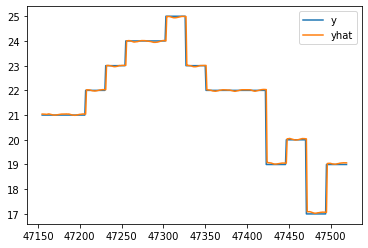

In [31]:
cv[["y", "yhat"]][-365:].plot()

In [35]:

m = fitt_proph(new_fd)
m.predict(new_fd.iloc[-1:])

DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/w0tj2x5b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/x5iwww4v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28401', 'data', 'file=/tmp/tmpupb5hz6b/w0tj2x5b.json', 'init=/tmp/tmpupb5hz6b/x5iwww4v.json', 'output', 'file=/tmp/tmpupb5hz6b/prophet_model950kmvcs/prophet_model-20230105104647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:46:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:47:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,FeelsLikeC,FeelsLikeC_lower,FeelsLikeC_upper,HeatIndexC,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-01 23:00:00,32.709363,18.557708,19.542015,32.709363,32.709363,-0.049707,-0.049707,-0.049707,-0.037453,...,-0.00051,-0.00051,-0.00051,-0.13986,-0.13986,-0.13986,0.0,0.0,0.0,19.061431


In [33]:

m = Prophet()
m.fit(new_fd)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/z0b2wwjv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpupb5hz6b/h_p329jz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=65320', 'data', 'file=/tmp/tmpupb5hz6b/z0b2wwjv.json', 'init=/tmp/tmpupb5hz6b/h_p329jz.json', 'output', 'file=/tmp/tmpupb5hz6b/prophet_model79jiu517/prophet_model-20230105104253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:42:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:45:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [34]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)